# 14. 내가 직접 만드는 강아지 고양이 분류기

In [2]:
# $ pip install pillow

In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


## 이미지 분류 문제
텐서플로우(TensorFlow)를 활용해 이미지를 분류할 수 있는 모델 설계해보기

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


## 1. 학습 데이터 준비하기
- `tensorflow_datasets`: 텐서플로우가 제공하는 데이터셋 모음집
https://www.tensorflow.org/datasets/catalog/overview

In [3]:
import tensorflow_datasets as tfds
tfds.__version__

'4.4.0'

In [4]:
(raw_train, raw_validation, raw_test), \
    metadata = tfds.load('cats_vs_dogs',
                        split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
                        with_info=True,
                        as_supervised=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling cats_vs_dogs-train.tfrecord...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /aiffel/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


> 🥕 **WARNING:absl:1738 images were corrupted and were skipped**
> : image들의 사이즈들이 모두 다른데, 일부 corrupt된 이미지들은 skip됨

> `split`
> - train 데이터는 80%
> - validation 데이터는 80-90%
> - test 데이터는 90%이상

> `with_info`
> - `True`라면 (tf.data.Dataset, tfds.cored.DatasetInfo)를 return함

> `as_supervised`
> - `True`라면 (input, label)이라는 2-tuple을 return함
> - `False`라면 모든 features에 대해 dictionary 형태로 return함

> **return**
> - `ds`: tf.data.Dataset
> - `ds_info`: tfds.core.DatasetInfo

In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


`((None, None, 3), ())`
> 모든 데이터셋은 `(image, label)`의 형태를 가짐
> - `(None, None, 3)`: image의 shape
> - `()`: 정답 카테고리인 label의 shape

> 이미지는 (height, width, channel)의 3차원 데이터 형태
> - 여기서 height와 width가 None으로 나타난 이유는 모든 이미지의 크기가 다르기 때문
> - 3은 RGB의 3개의 채널을 의미

## 전처리

In [6]:
import matplotlib.pyplot as plt
# 그림 바로 출력
%matplotlib inline
# 해상도 더 높여줌
%config InlineBackend.figure_format = 'retina'

- take: 인수로 받은 개수만큼의 데이터 추출하여 새로운 데이터셋 인스턴스 생성해 리턴

In [14]:
metadata.features['label']

ClassLabel(shape=(), dtype=tf.int64, num_classes=2)

In [15]:
metadata.features['label'].int2str

<bound method ClassLabel.int2str of ClassLabel(shape=(), dtype=tf.int64, num_classes=2)>

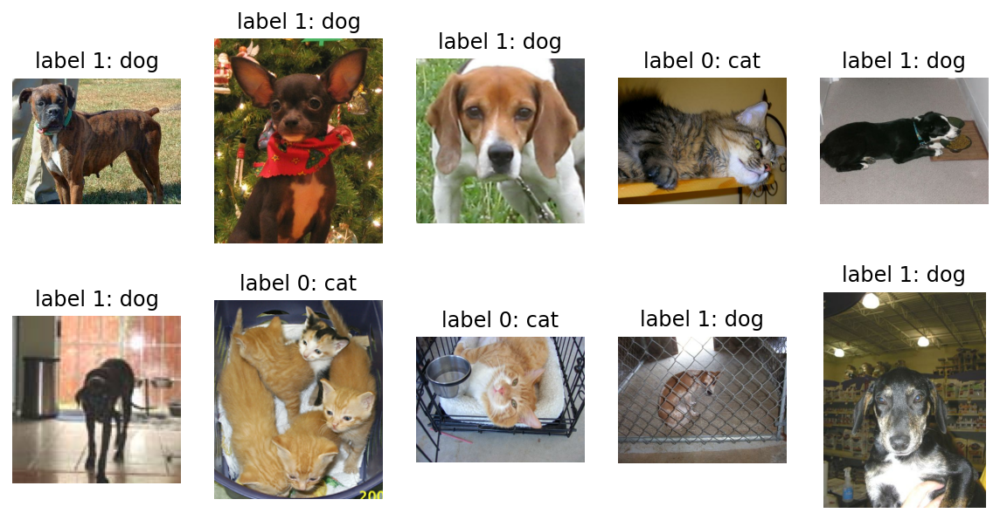

In [7]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str # label 이름을 str으로 변경

for idx, (image, label) in enumerate(raw_train.take(10)): # 10개의 데이터 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
    
# label: 개(1), 고양이(0)
# get_label_name: 개(dog), 고양이(cat)

> 이미지 사이즈 통일시키자
> - `타입캐스팅(Type Casting)` : 다른 데이터 타입으로 형(타입)을 바꿔주는 것

In [17]:
IMG_SIZE = 160 # resizing할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32) # image=float(image)같은 타입캐스팅의 텐서플로우 버전
    image = (image/127.5) - 1 # 픽셀 값의 scale 수정 (0~255에서 -1~1)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [18]:
# 위에서 생성한 format_example() 함수 적용시키기
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


> 이제 `(160, 160, 3)`으로 일정한 크기로 변경된 것을 확인할 수 있다.
> - 추가로 image도 float32으로 데이터 타입을 변경시켜 주어 `tf.float32`임을 확인 가능

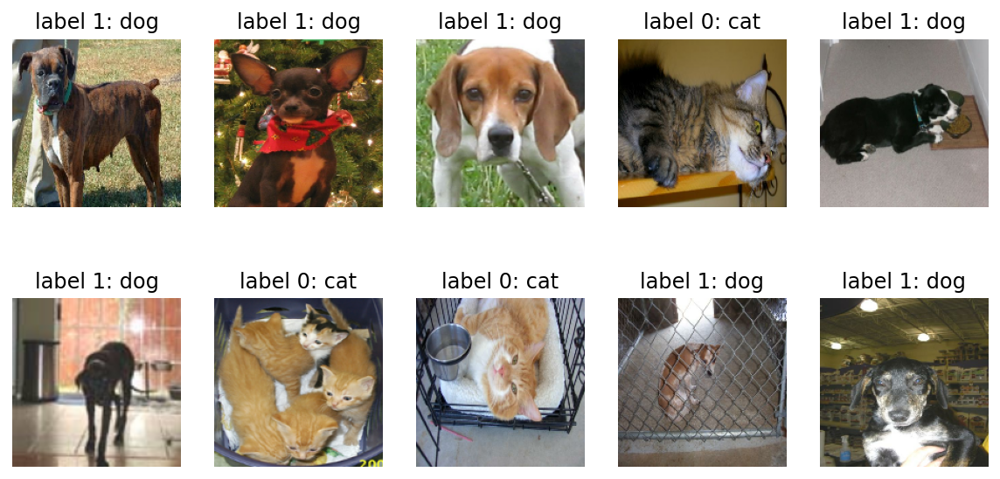

In [47]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image+1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

> 이미지 크기가 균일해졌다.

## 텐서플로우를 활용해 모델 구조 설계하기

In [19]:
# 모델 생성에 필요한 함수들
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

> `models`: 모델 그 자체를 구축하기 위한 함수들을 포함

> `layers`: 모델의 구성 요소인 여러 종류의 레이어(layer), 즉 '층'이란 함수들을 가짐

> `Sequential`: '연속적인' 모델 쌓기 위한 함수
> - 함수 안에 연속적으로 여러 레이어들이 들어간다.

In [32]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

**딥러닝** 모델은 위와 같이 여러 개의 층을 쌓는 형태로 구성된다.
- Conv2D, MaxPooling2D, Flatten, Dense라는 4가지 종류의 **레이어** 사용

- `filters`: 몇 개의 다른 종류의 필터를 활용할 것인지를 나타냄. 출력 모양의 **깊이(depth)** 결정
> `(160, 160, 3)`이 입력으로 들어왔는데 필터 수가 16개이므로 출력의 depth는 16일 것이다. -> `(None, 160, 160, 16)`

- **channel의 개수를 depth라 표현함**

- `kernel_size`: 필터 행렬의 크기

In [33]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 20, 20, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 25600)            

- 입력 이미지의 크기: `(160, 160, 3)`

> - `None`: **배치(batch) 사이즈**에 따라 모델에 다른 수의 입력이 들어올 수 있음

- 이미지는 각 레이어들을 지나면서 height & width는 점점 작아지고, channel은 점점 커지다가, flatten 계층을 만나 하나의 숫자(20x20x64=25,600)이라는 하나의 숫자로 (1차원으로) shape이 줄어든다.
- 앞의 CNN에서 점점 작은 feature map이 출력되다가, Flatten과 Dense 레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크 - CNN을 사용한 딥러닝 모델의 가장 대표적인 형태

> - `height` & `width`: `160 -> 80 -> 40 -> 20`로 작아짐
> - `channel`: `16 -> 32 -> 64`로 커짐

<br/>

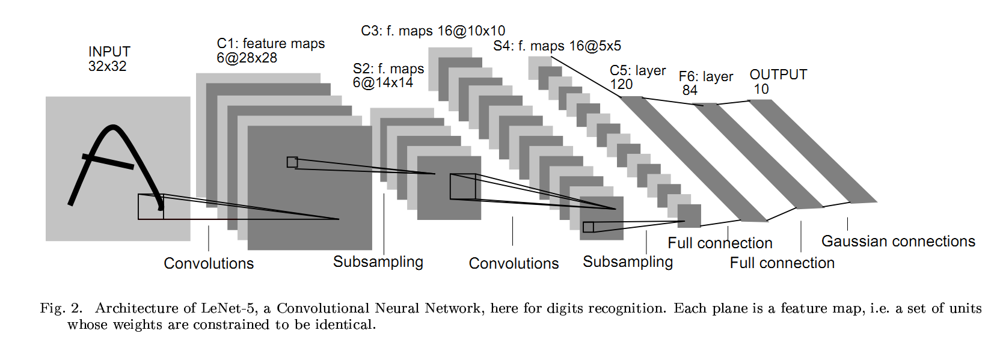
[출처](http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf)

<br/>

맨 왼쪽처럼 한 장의 이미지가 입력되었을 때 Convolutional(합성곱) 연산을 통해 그 형태가 점점 길쭉해진 뒤, Flatten 레이어를 만나 오른쪽처럼 한 줄로 펴진다.
> **3차원 이미지를 1차원**으로 펼치는 것


### - Flatten 이해해보기

In [22]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [35]:
# flatten 시켜본다면?
image.flatten() # 모든 숫자를 일렬로 펼쳐놓은 것과 같게 됨

array([1, 2, 3, 4])

> Flatten으로 일렬로 쫙 펼친 뒤, `Dense` 레이얼르 지나게 된다면 512개의 노드로 축소시켜 최종 출력은 단 2개의 숫자로 구성된 하나의 **확률분포**를 내뱉을 것이다.
> - 이 두 숫자는 각 입력된 이미지가 강아지일 확률, 고양이일 확률을 의미한다.

> 즉, 딥러닝 모델은 `(160, 160, 3)` 크기의 3차원 이미지를 입력 받아 여러 레이어를 거치며 형태를 바꾼 뒤 최종적으로는 몇 개의 숫자를 출력해내는 함수이다.

## 모델 compile 완료 후 학습시키기

> `learning_rate`(학습률): 0.0001

In [35]:
learning_rate = 0.0001 # 학습률

model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

`compile`을 위해선
> - `optimizer`(최적화 함수): **학습을 어떤 방식으로 시킬 것인지** 결정
> - `loss`: **모델이 학습해나가야 하는 방향** 결정
>> input image가 고양이(label=0)이었다면, 모델 출력이 `[1.0, 0.0]`에 가깝도록, 강아지(label=1)이었다면, 모델 출력이 `[0.0, 1.0]`에 가까워지도록 하는 방향 제시
> - `metrics`: **모델의 성능을 평가하는 척도**
>> 분류 문제를 풀 때, 성능 평가 지표로 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있음


In [36]:
BATCH_SIZE = 32 # 한 스텝에 학습시킨 데이터 수
SHUFFLE_BUFFER_SIZE = 1000 # 학습 데이터 적절히 섞어줄 수

> `train_batches`: 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 랜덤으로 32개(`BATCH_SIZE`)를 뽑아 계속 제공해주기
> - 반면 `validation_batches`와 `test_batches`에서는 랜덤성을 부여하지 않는다. (할 때마다 다른 결과값 나오는 것 방지하기 위해)

In [37]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [38]:
# train_batches에서 하나의 batch만 꺼내 확인해보기

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

> - `image_batch`의 shape는 `[32, 160, 160, 3]`을,
> - `label_batch`의 shape는 `[32]`를 나타냄

>> - image_batch는 (160, 160, 3)의 shape인 데이터가 32개 존재
>> - label은 고양이이면 0, 강아지이면 1로 정답 label을 나타내므로 한 batch에 데이터가 32개라면 label은 0 or 1의 숫자 32개로만 구성된다.

In [39]:
# 초기 모델 성능 확인하기

validation_steps = 20 # 20번의 예측

# 평균 loss, 평균 accuracy 확인
loss0, accuracy0 = model.evaluate(validation_batches,
                                  steps=validation_steps)

print('initial loss: {:.2f}'.format(loss0))
print('initial accuaracy: {:.2f}'.format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 0.6839 - accuracy: 0.5469

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 25s 26ms/step - loss: 0.6861 - accuracy: 0.5406
initial loss: 0.69
initial accuaracy: 0.54


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


> loss: 70% <br/>
> accuracy: 약 50%

- 두 장 중 하나를 찍어도 50%가 나오기 때문에 **전혀 의미 없는 예측**임

In [40]:
# 10 epoch 학습 시키기 (오래 걸림 !!!)
EPOCHS = 10
history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/10
170/582 [=======>......................] - ETA: 17s - loss: 0.6657 - accuracy: 0.6068

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.6569 - accuracy: 0.6157

212/582 [=========>....................] - ETA: 15s - loss: 0.6555 - accuracy: 0.6178

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.6389 - accuracy: 0.6320

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.6025 - accuracy: 0.6665

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.6010 - accuracy: 0.6683

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.5993 - accuracy: 0.6700

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.5949 - accuracy: 0.6751

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.5942 - accuracy: 0.6760

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5904 - accuracy: 0.6793

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 32s 46ms/step - loss: 0.5904 - accuracy: 0.6793 - val_loss: 0.5239 - val_accuracy: 0.7485
Epoch 2/10
169/582 [=======>......................] - ETA: 17s - loss: 0.5070 - accuracy: 0.7457

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.5022 - accuracy: 0.7495

213/582 [=========>....................] - ETA: 15s - loss: 0.5027 - accuracy: 0.7497

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.4973 - accuracy: 0.7548

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4818 - accuracy: 0.7670

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.4820 - accuracy: 0.7676

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.4816 - accuracy: 0.7681

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.4794 - accuracy: 0.7699

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.4785 - accuracy: 0.7705

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.4763 - accuracy: 0.7712

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.4768 - accuracy: 0.7709 - val_loss: 0.4967 - val_accuracy: 0.7614
Epoch 3/10
169/582 [=======>......................] - ETA: 17s - loss: 0.4401 - accuracy: 0.7966

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 15s - loss: 0.4365 - accuracy: 0.7994

213/582 [=========>....................] - ETA: 15s - loss: 0.4364 - accuracy: 0.8000

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.4311 - accuracy: 0.8016

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.4178 - accuracy: 0.8090

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.4164 - accuracy: 0.8099

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.4153 - accuracy: 0.8109

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4154 - accuracy: 0.8113

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.4147 - accuracy: 0.8116

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.4145 - accuracy: 0.8118

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.4145 - accuracy: 0.8118 - val_loss: 0.6108 - val_accuracy: 0.7120
Epoch 4/10
169/582 [=======>......................] - ETA: 16s - loss: 0.3963 - accuracy: 0.8284

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3922 - accuracy: 0.8300

213/582 [=========>....................] - ETA: 15s - loss: 0.3905 - accuracy: 0.8316

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.3844 - accuracy: 0.8332

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3705 - accuracy: 0.8378

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3700 - accuracy: 0.8382

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3693 - accuracy: 0.8389

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3680 - accuracy: 0.8395

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3686 - accuracy: 0.8391

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3662 - accuracy: 0.8404

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3661 - accuracy: 0.8404 - val_loss: 0.4680 - val_accuracy: 0.7893
Epoch 5/10
169/582 [=======>......................] - ETA: 16s - loss: 0.3413 - accuracy: 0.8550

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3401 - accuracy: 0.8547

213/582 [=========>....................] - ETA: 14s - loss: 0.3388 - accuracy: 0.8559

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.3344 - accuracy: 0.8583

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3228 - accuracy: 0.8613

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3220 - accuracy: 0.8620

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3208 - accuracy: 0.8627

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3191 - accuracy: 0.8631

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3192 - accuracy: 0.8628

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3177 - accuracy: 0.8636

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.3175 - accuracy: 0.8635 - val_loss: 0.4571 - val_accuracy: 0.7911
Epoch 6/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2885 - accuracy: 0.8787

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.2922 - accuracy: 0.8742

212/582 [=========>....................] - ETA: 15s - loss: 0.2900 - accuracy: 0.8760

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.2863 - accuracy: 0.8779

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2754 - accuracy: 0.8845

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2748 - accuracy: 0.8849

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2734 - accuracy: 0.8856

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2713 - accuracy: 0.8871

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2708 - accuracy: 0.8874

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2701 - accuracy: 0.8879

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.2701 - accuracy: 0.8879 - val_loss: 0.4882 - val_accuracy: 0.7919
Epoch 7/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2456 - accuracy: 0.9022

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.2429 - accuracy: 0.9035

212/582 [=========>....................] - ETA: 15s - loss: 0.2427 - accuracy: 0.9039

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.2382 - accuracy: 0.9059

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2296 - accuracy: 0.9075

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2285 - accuracy: 0.9080

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.2278 - accuracy: 0.9085

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2258 - accuracy: 0.9098

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2254 - accuracy: 0.9097

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2253 - accuracy: 0.9094

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 46ms/step - loss: 0.2253 - accuracy: 0.9095 - val_loss: 0.5545 - val_accuracy: 0.7747
Epoch 8/10
169/582 [=======>......................] - ETA: 19s - loss: 0.1985 - accuracy: 0.9236

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 17s - loss: 0.1968 - accuracy: 0.9250

212/582 [=========>....................] - ETA: 17s - loss: 0.1977 - accuracy: 0.9244

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 13s - loss: 0.1928 - accuracy: 0.9262

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 4s - loss: 0.1871 - accuracy: 0.9290

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 3s - loss: 0.1862 - accuracy: 0.9297

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 3s - loss: 0.1853 - accuracy: 0.9300

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.1843 - accuracy: 0.9304

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.1843 - accuracy: 0.9303

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1827 - accuracy: 0.9307

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 30s 50ms/step - loss: 0.1826 - accuracy: 0.9307 - val_loss: 0.5255 - val_accuracy: 0.7936
Epoch 9/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1536 - accuracy: 0.9487

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.1565 - accuracy: 0.9454

212/582 [=========>....................] - ETA: 15s - loss: 0.1555 - accuracy: 0.9458

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1505 - accuracy: 0.9484

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1450 - accuracy: 0.9495

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.1447 - accuracy: 0.9496

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1441 - accuracy: 0.9498

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.1423 - accuracy: 0.9507

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1418 - accuracy: 0.9510

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1410 - accuracy: 0.9513

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.1410 - accuracy: 0.9513 - val_loss: 0.6411 - val_accuracy: 0.7657
Epoch 10/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1186 - accuracy: 0.9599

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1161 - accuracy: 0.9619

212/582 [=========>....................] - ETA: 15s - loss: 0.1179 - accuracy: 0.9596

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1132 - accuracy: 0.9615

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1108 - accuracy: 0.9618

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.1111 - accuracy: 0.9617

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1104 - accuracy: 0.9621

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 1s - loss: 0.1090 - accuracy: 0.9626

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1083 - accuracy: 0.9630

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1083 - accuracy: 0.9630

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1081 - accuracy: 0.9631 - val_loss: 0.5911 - val_accuracy: 0.7954


> - accuracy=0.96
> - val_accuracy=0.79

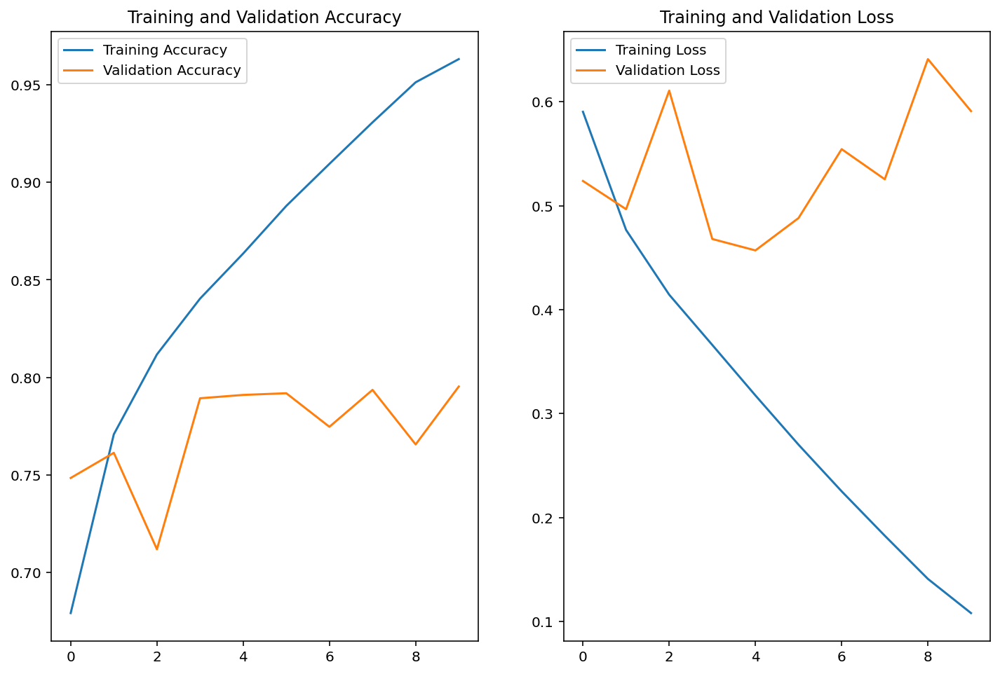

In [41]:
# 학습 단계에 따른 정확도 변화를 그래프로 나타내기

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

> - train acc는 10 epoch를 진행하며 꾸준히 증가하지만, val acc는 그에 비해 매우 불안정하게 증가하며 증가폭도 매우 적다.: **Overfitting(과적합)**
>> - train acc는 현재 학습하는 데이터셋에 대한 정확도이기 때문에 모델의 구조나 데이터셋 등에 문제가 없다면 일반적으로 학습할수록 꾸준히 오른다.
>> - 반면 val acc는 학습하지 않은 데이터셋에 대한 정확도이기 때문에 일정수준까지 오른 후 계속 오른지 장담할 수 없다.
> - train loss는 꾸준히 감소하는 양상을 보이지만, val loss는 불안정하다가 결국 증가한다.

In [43]:
# 검증 정확도가 80%까지 올라간(우리가 학습시킨) 모델의 예측 결과 확인하기

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9983978e-01, 1.6018233e-04],
       [9.0894324e-01, 9.1056734e-02],
       [8.0324702e-02, 9.1967535e-01],
       [9.9999237e-01, 7.5844705e-06],
       [9.5036548e-01, 4.9634483e-02],
       [5.4141617e-01, 4.5858386e-01],
       [1.7925773e-02, 9.8207420e-01],
       [3.9255741e-01, 6.0744262e-01],
       [8.4256269e-02, 9.1574371e-01],
       [1.1188445e-01, 8.8811553e-01],
       [4.8034493e-02, 9.5196551e-01],
       [9.9996865e-01, 3.1379703e-05],
       [9.9854136e-01, 1.4586004e-03],
       [7.9405791e-04, 9.9920601e-01],
       [9.9581558e-01, 4.1844808e-03],
       [9.9978012e-01, 2.1994856e-04],
       [6.2363178e-01, 3.7636825e-01],
       [1.9351228e-05, 9.9998069e-01],
       [9.4806916e-01, 5.1930856e-02],
       [9.9868792e-01, 1.3121178e-03],
       [4.6430296e-01, 5.3569704e-01],
       [3.9923310e-01, 6.0076690e-01],
       [9.9892765e-01, 1.0723528e-03],
       [9.9603397e-01, 3.9660526e-03],
       [9.7701901e-01, 2.2981035e-02],
       [4.5878179e-02, 9.

> `predictions`의 위 값들은 모델이 판단할 `[고양이일 확률, 강아지일 확률]`인데, `[1.0, 0.0]`에 가까울수록 고양이(0)로, `[0.0, 1.0]`에 가까울수록 강아지(1)로 예측한 것이다.
>> 즉, 고양이일 확률이 더 높으면 고양이로, 그렇지 않으면 강아지로 예측한 것 !!

In [44]:
# prediction 값들을 실제 추론한 라벨(0, 1)로 변환해보기
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

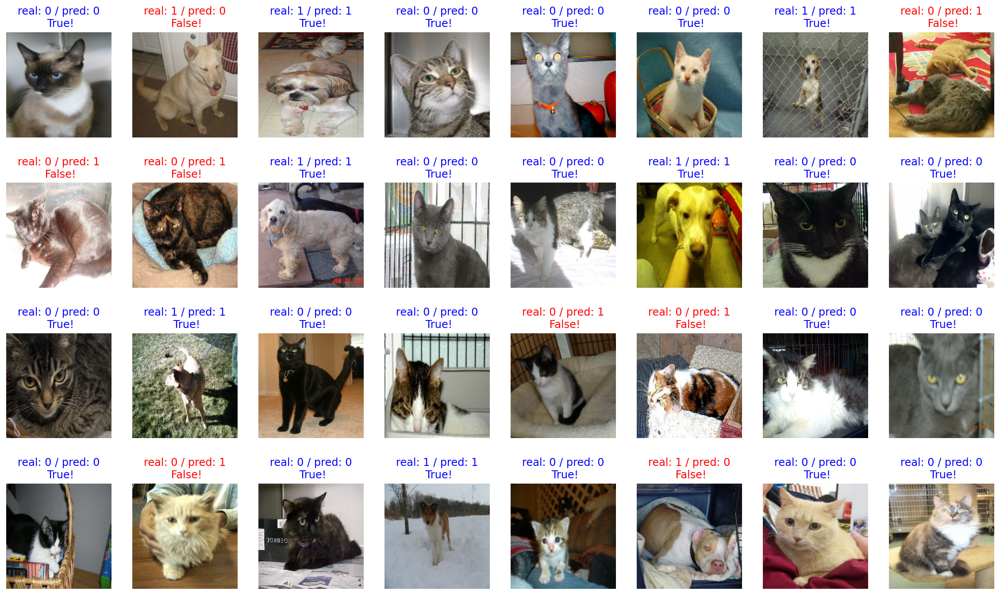

In [45]:
# 시각화하기

plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image+1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred: {prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

> 일부 틀린 것들도 종종 보인다.

In [46]:
# 직접 맞은 예측의 개수를 세는 코드

count = 0 # 정답 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

print(count / 32 * 100)

75.0


약 80% 정도의 검증 정확도까지 달성했는데, 만약 엄청나게 크고 학습 시간도 오래 걸리는 모델을 이미 학습 시켜 놓은 것을 쓰면 어떤 결과가 나올까?

## 이미지 분류 대회인 ILSVRC와 데이터셋 ImageNet

**`ILSVRC`** (ImageNet Large Scale Visual Recognition Challenge)
- 이미지 분류 대회
- 여기서 분류해야 하는 데이터셋은 **ImageNet**으로, 총 1000개의 카테고리와 수백 만의 이미지 데이터로 이루어져 있음

> 이 `ImageNet`은 분명 1,000개의 카테고리를 맞추는 모델이었고, 우리가 사용하는 데이터는 강아지/고양이 분류기인데 이를 어떻게 사용할 수 있는 거지?
>> `거인의 어깨에 서서` 문제를 푼다는 **Transfer Learning(전이학습)**!!

<br/>

일반적으로 CNN은 합성곱층과 풀링층이 여러 겹 쌓여있는 `Convolutional base`와 완전 연결 계층으로 이루어진 `Classifier`의 두 파트로 나누어진다.
- Convolutional base: 이미지로부터 특징을 효과적으로 추출
- Classifier: 추출된 특징을 잘 학습해 이미지를 알맞은 카테고리로 분류

<br/>

### 전이 학습 (Transfer Learning)
1. 전체 모델을 새로 학습시킴
- 사전학습 모델의 구조만 사용
2. Convolutional base의 일부분은 고정, 나머지 계층과 classifier만 새로 학습시킴
3. Convolutional base는 고정, classifier만 새로 학습시킴

> 우리가 사용할 모델은 ILSVRC에서 쓰인 모델로 수백 만장의 데이터로 학습된 모델인데, <br/>
> 그에 비해 우리가 새로 학습시킬 데이터는 강아지, 고양이의 약 2만 장의 데이터로 매우 작은 데이터셋이다. 따라서 모델을 새로 학습시킨다기보단 classifier만 새로 학습시키는 전략 3이 적절할 것이다.

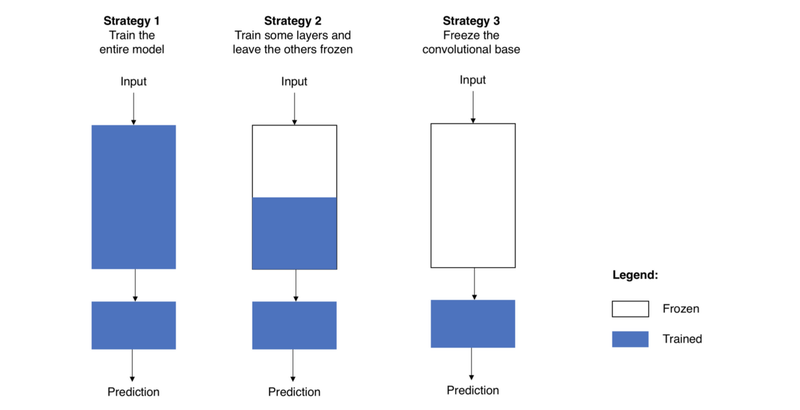

<br/>

> 간단히 말하자면, 누군가 이미 잘 만든 모델을 가져와 내 입맛에 맞게 일부분만 새로 학습시켜 사용하는 것

위 그림 중 3번째 그림처럼 convolutional base는 모두 가만히 두고(freeze), 아래의 classifier 부분만 새로 학습시키는 것

## 사전 학습 모델인 VGG16 가져오고, 모델의 구조 확인하기

**`VGG16`**: IILSVRC 물체 위치 찾기 태스크에서 우승한 VGG 모델
- 이미지 처리 분야에서 사랑받는 모델 중 하나

> 다음 간단한 코드로 VGG 모델을 `base_model`의 변수로 불러올텐데, output에 가까운 높은 레벨의 3개의 FC 레이어는 제외하고 분류해야 하므로, `include_top=False` 옵션을 주었다.

In [47]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                        include_top=False, # output에 가까운 높은 레벨의 3개 FC 레이어는 제외
                                        weights='imagenet')

58900480/58889256 [==============================] - 0s 0us/step


> 이 모델은 입력된 이미지를 입력받으면 해당 이미지의 특징을 잘 뽑아낸 특징 벡터를 추출할 수 있을 것

In [48]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [49]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

이미지의 개수는 32장으로 동일한데, 사이즈가 많이 달라졌다!
- height, width는 5로 줄어들고, channel은 512로 증가함
- 이 벡터를 이미지에서 특징을 추출해 낸 **특징 벡터**라고 부르기도 함

In [50]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

> layer 수가 훨씬 많다!

<br/>

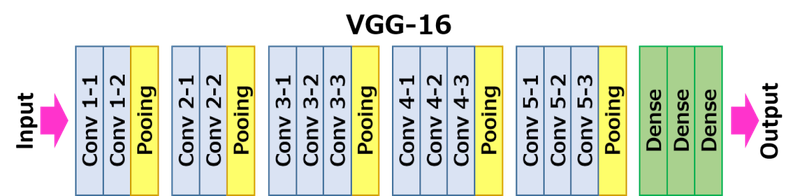

<br/>

> Dense레이어는 빠져있다. Why?
> - transfer learning을 수행하며 새로 학습시킬 것이기 때문에

### VGG16 끝단에 classifier 레이어를 붙여 원하는 구조의 분류 모델 만들기
- 모델이 이미지로부터 **특징 벡터** 내뱉는다는 것 확인함
- 이 특징 벡터로부터 분류할 수 있는 **classifier**를 구성하자!

In [51]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

> classifier을 구성하려면 Fully connected 레이어로 구성해야 함

<br/>

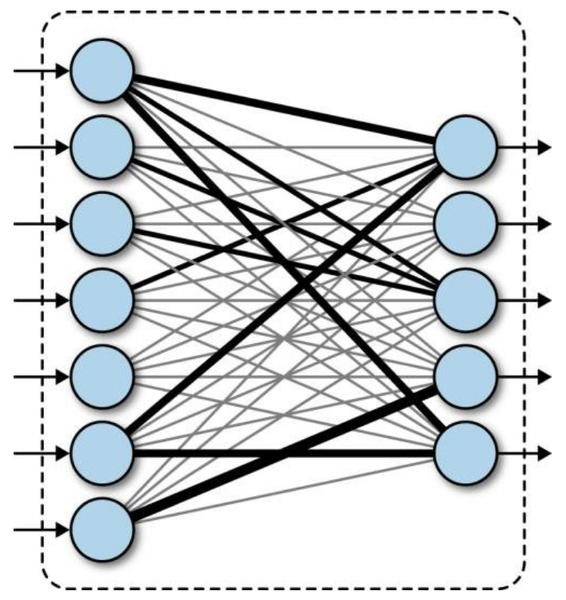

<br/>

- Fully connected layer (완전연결계층)
- 이전 계층의 모든 숫자들이 다음 계층의 모든 숫자와 연결되어야 함
- 입력될 수 있는 벡터는 반드시 1차원이어야 함!
- but, 우리가 본 VGG16의 출력 벡터는 3차원이었다.
- 이를 1차원으로 변환해야 할 것이다.
- 위에서 살펴본 3차원 벡터를 일렬로 쭉 펴는 역할의 계층: **`Flatten 레이어`**

### Global Average Pooling

- 2차원 or 3차원 벡터를 1차원으로 축소하는 방법에 Flattening보다 더 효과적인 방법

> `Global Average Pooling`을 거치면 (height, width, depth)의 shape가 (1, 1, depth)로 바뀐다. 이는 그냥 (depth)의 shape로 **1차원 벡터**라고 볼 수 있다.

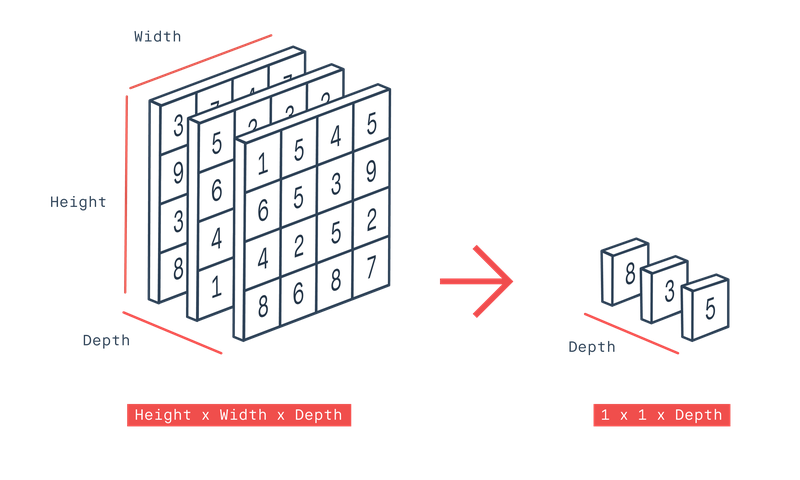

<br/>

> - 3차원의 벡터를 -> 겹겹이 쌓인 2차원 배열의 평균을 구한 후 하나의 값으로 축소하는 기법
> - 즉, **평균값을 이용해 벡터의 차원을 줄이는 기법**
>> ex) `[32, 5, 5, 512]` -> `[32, 1, 1, 512]`, 즉 `[32, 512]`

In [52]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

> 이 `global_average_layer`에 VGG16이 출력했던 `feature_batch`를 입력해보자.

In [53]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape) # 평균이 잘 취해짐

(32, 512)


> 마지막으로 여기에 Dense 레이어들을 붙여주면 classifier 완성

In [54]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_average가 dense_layer을 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


> 우리의 데이터들은 처음 이미지에서 특징을 추출해줄 VGG16, `base_model`에 입력되어 특징이 추출된 뒤, 그 특징 벡터는 `global_average_layer`를 거쳐 마지막에 `prediction_layer`까지 통과하며 강아지인지, 고양이인지 예측이 될 것

In [55]:
# base_model은 학습시키지 않을 것
base_model.trainable = False

In [56]:
model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [57]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


> VGG16 안의 복잡한 레이어들은 base_model로 추상화시킨 것

### VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해보기

In [58]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
             loss=tf.keras.losses.sparse_categorical_crossentropy,
             metrics=['accuracy'])

In [59]:
validation_steps = 20
loss0, accuaracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 0s - loss: 0.6997 - accuracy: 0.5417

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7047 - accuracy: 0.5330

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 5s 69ms/step - loss: 0.7048 - accuracy: 0.5328
initial loss: 0.70
initial accuracy: 0.54


아직 학습이 되지 않은 상태이니 50%의 정확도!

In [60]:
EPOCHS = 5 # 이전보다 훨씬 빠르게 수렴되므로 5정도도 충분!

history = model.fit(train_batches,
                   epochs=EPOCHS,
                   validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 47s - loss: 0.3787 - accuracy: 0.8748

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 41s - loss: 0.3562 - accuracy: 0.8822

210/582 [=========>....................] - ETA: 40s - loss: 0.3514 - accuracy: 0.8835

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 30s - loss: 0.3200 - accuracy: 0.8924

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 8s - loss: 0.2673 - accuracy: 0.9059

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 7s - loss: 0.2654 - accuracy: 0.9060

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 6s - loss: 0.2637 - accuracy: 0.9063

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2589 - accuracy: 0.9082

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 3s - loss: 0.2580 - accuracy: 0.9085

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2532 - accuracy: 0.9096

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 67s 112ms/step - loss: 0.2532 - accuracy: 0.9096 - val_loss: 0.1744 - val_accuracy: 0.9282
Epoch 2/5
166/582 [=======>......................] - ETA: 46s - loss: 0.1643 - accuracy: 0.9347

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 46s - loss: 0.1646 - accuracy: 0.9347

209/582 [=========>....................] - ETA: 45s - loss: 0.1649 - accuracy: 0.9342

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 40s - loss: 0.1642 - accuracy: 0.9333

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 13s - loss: 0.1626 - accuracy: 0.9340

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 12s - loss: 0.1629 - accuracy: 0.9333

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 10s - loss: 0.1618 - accuracy: 0.9338

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 6s - loss: 0.1618 - accuracy: 0.9338

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 5s - loss: 0.1617 - accuracy: 0.9339

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1601 - accuracy: 0.9345

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 99s 168ms/step - loss: 0.1601 - accuracy: 0.9345 - val_loss: 0.1544 - val_accuracy: 0.9338
Epoch 3/5
166/582 [=======>......................] - ETA: 1:10 - loss: 0.1449 - accuracy: 0.9371

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 1:06 - loss: 0.1471 - accuracy: 0.9369

209/582 [=========>....................] - ETA: 1:04 - loss: 0.1468 - accuracy: 0.9371

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 50s - loss: 0.1476 - accuracy: 0.9384

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 15s - loss: 0.1480 - accuracy: 0.9379

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 13s - loss: 0.1483 - accuracy: 0.9376

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 11s - loss: 0.1481 - accuracy: 0.9374

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 7s - loss: 0.1471 - accuracy: 0.9383

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 6s - loss: 0.1469 - accuracy: 0.9386

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1461 - accuracy: 0.9391

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 109s 185ms/step - loss: 0.1461 - accuracy: 0.9391 - val_loss: 0.1565 - val_accuracy: 0.9372
Epoch 4/5
166/582 [=======>......................] - ETA: 1:11 - loss: 0.1364 - accuracy: 0.9413

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 1:05 - loss: 0.1353 - accuracy: 0.9428

209/582 [=========>....................] - ETA: 1:03 - loss: 0.1362 - accuracy: 0.9435

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 52s - loss: 0.1403 - accuracy: 0.9416

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 13s - loss: 0.1415 - accuracy: 0.9425

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 11s - loss: 0.1408 - accuracy: 0.9425

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 9s - loss: 0.1410 - accuracy: 0.9423

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 5s - loss: 0.1409 - accuracy: 0.9423

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 4s - loss: 0.1407 - accuracy: 0.9424

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1395 - accuracy: 0.9433

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 92s 156ms/step - loss: 0.1395 - accuracy: 0.9433 - val_loss: 0.1433 - val_accuracy: 0.9377
Epoch 5/5
166/582 [=======>......................] - ETA: 1:10 - loss: 0.1290 - accuracy: 0.9454

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 1:05 - loss: 0.1308 - accuracy: 0.9443

209/582 [=========>....................] - ETA: 1:03 - loss: 0.1299 - accuracy: 0.9451

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 51s - loss: 0.1347 - accuracy: 0.9438

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 15s - loss: 0.1361 - accuracy: 0.9430

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 13s - loss: 0.1359 - accuracy: 0.9432

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 11s - loss: 0.1361 - accuracy: 0.9428

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 7s - loss: 0.1357 - accuracy: 0.9428

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 6s - loss: 0.1353 - accuracy: 0.9432

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1343 - accuracy: 0.9437

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 110s 186ms/step - loss: 0.1343 - accuracy: 0.9437 - val_loss: 0.1432 - val_accuracy: 0.9390


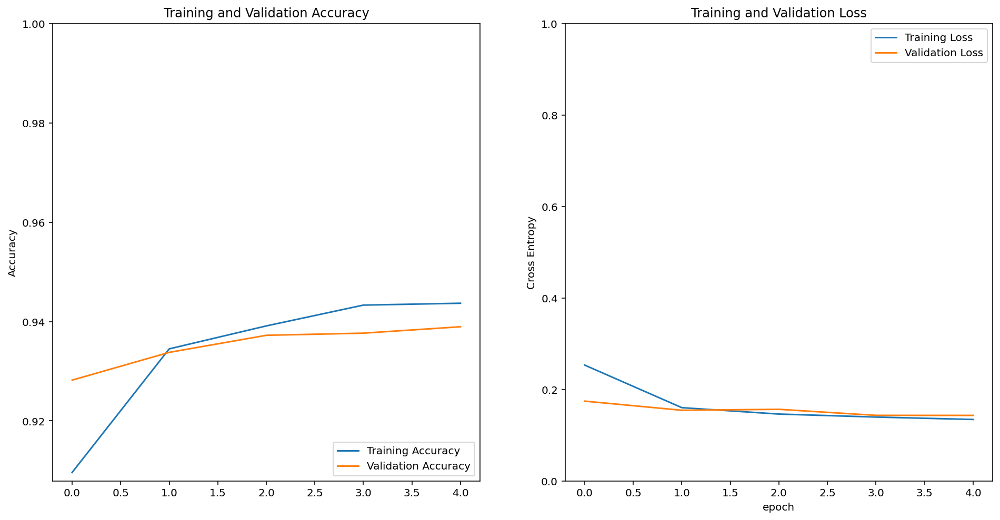

In [61]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

> 우리가 직접 만든 모델과 다르게 정확도도 꾸준히 올라가고 validation loss도 매우 안정적

In [62]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998784e-01, 1.2133564e-05],
       [1.6692375e-01, 8.3307624e-01],
       [4.7302264e-01, 5.2697736e-01],
       [9.9999595e-01, 4.0351556e-06],
       [9.9870229e-01, 1.2977386e-03],
       [9.9278474e-01, 7.2152270e-03],
       [2.2897952e-04, 9.9977106e-01],
       [7.8977168e-01, 2.1022832e-01],
       [9.7785872e-01, 2.2141220e-02],
       [9.8076874e-01, 1.9231282e-02],
       [1.0326881e-04, 9.9989676e-01],
       [9.9994373e-01, 5.6221787e-05],
       [9.9390417e-01, 6.0958224e-03],
       [6.7732030e-06, 9.9999321e-01],
       [9.9913257e-01, 8.6745806e-04],
       [9.9192166e-01, 8.0784019e-03],
       [9.9723452e-01, 2.7654527e-03],
       [6.6600561e-02, 9.3339944e-01],
       [6.9658846e-01, 3.0341154e-01],
       [9.9587834e-01, 4.1216034e-03],
       [9.5123309e-01, 4.8766922e-02],
       [9.8977786e-01, 1.0222179e-02],
       [9.9449748e-01, 5.5025900e-03],
       [9.8831135e-01, 1.1688629e-02],
       [9.9908519e-01, 9.1476837e-04],
       [9.8879236e-01, 1.

In [63]:
# prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

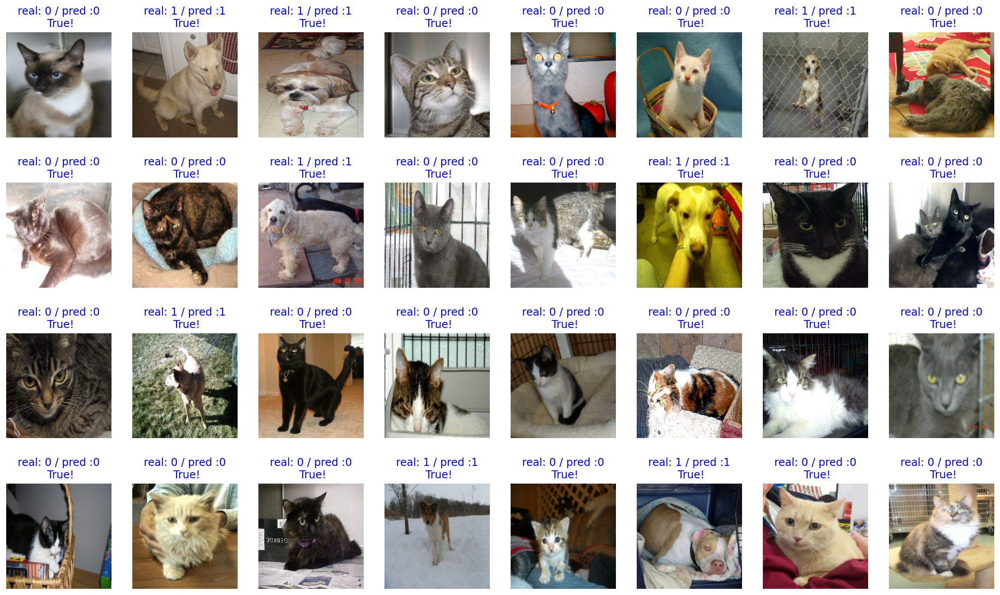

In [64]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

> 아까보다 훨씬 더 잘 맞춘다 !! 100%에 가까운 정확도

In [66]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 거의 100%

100.0


### 모델 save한 뒤 다시 load 해와서 사용해보기

In [49]:
# $ mkdir -p ~/aiffel/cat_vs_dog
# $ mkdir -p ~/aiffel/cat_vs_dog/checkpoint
# $ mkdir -p ~/aiffel/cat_vs_dog/images

In [67]:
import os

checkpoint_dir = os.getenv("HOME") + '/aiffel/cat_vs_dog/checkpoint'
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')

model.save_weights(checkpoint_file_path) # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
    print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


### 학습된 모델에 원하는 이미지 입력해 예측 결과 확인해보기
- 강아지와 고양이 분류하는 모델을 학습시켰으므로 이제 원하는 이미지를 넣어보자!
- dog.jpeg & cat.jpeg

In [68]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [69]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

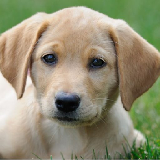

In [70]:
# (160, 160) 사이즈로 변환

IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [71]:
# 모델에 넣을 수 있도록 이미지를 array 형태로 변환해주기

dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

> 고양이라면 `[1.0, 0.0]`, 강아지라면 `[0.0, 1.0]`에 가까운 확률 분포가 예측될 것 !! <br/>
So easy?!

In [72]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

In [73]:
# filename만 바꾸면 원하는대로 실행 가능

def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


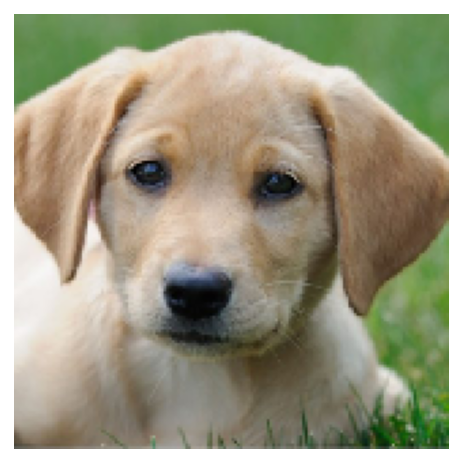

In [74]:
filename = 'my_dog.jpeg'
show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


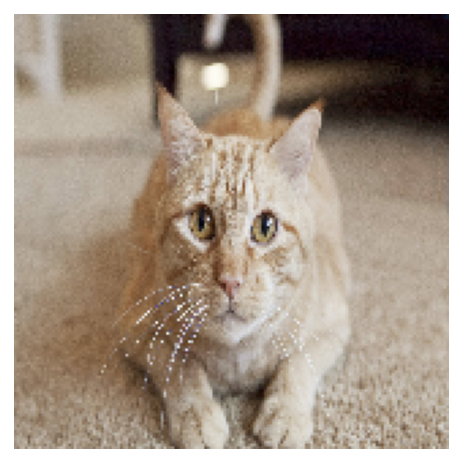

In [75]:
filename = 'my_cat.jpeg'
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


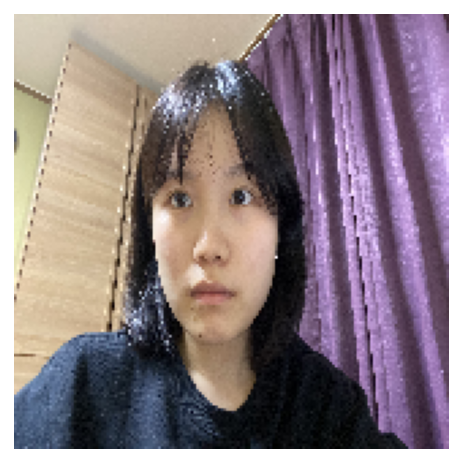

In [76]:
filename = 'my_face.png'
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


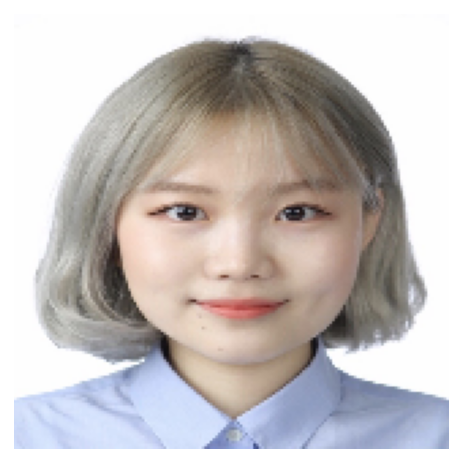

In [77]:
filename = 'my_face2.jpg'
show_and_predict_image(img_dir_path, filename)